## Импорт библиотек

In [1]:
import zipfile # Библиотека для работы с zip архивами
import os      # Библиотека для работы с фаловой системой 
from shutil import copy, move  

from google.colab import drive # Модуль для работы с Google Disk

import cv2
from PIL import Image

import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision as tv
from torchvision import transforms

import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

from tqdm import tqdm
import random
import time

## Загрузка данных

In [2]:
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# Прописываем путь к файлу с архивом
zip_file = "drive/My Drive/Deep Learning projects/Animal-10/animals.zip"

# Распаковываем архив
z = zipfile.ZipFile(zip_file, 'r')
z.extractall()

# Просмотр результата разархивации
print(os.listdir())

['.config', 'translate.py', 'drive', 'raw-img', 'sample_data']


Перевод названий животных с итальянского языка на английский

In [4]:
translate = {"cane": "dog",
             "cavallo": "horse",
             "elefante": "elephant",
             "farfalla": "butterfly",
             "gallina": "chicken",
             "gatto": "cat",
             "mucca": "cow",
             "pecora": "sheep",
             "scoiattolo": "squirrel",
             "ragno": "spider"}

## Создание датасета

### Train And Test Split

Разобъем изображения на тестовые и тренировочные

Для начала создадим путь и папки где в будущем будут храниться картинки

In [5]:
train_path_cane = './raw-img/training_set/cane'
test_path_cane = './raw-img/test_set/cane'

train_path_cavallo = './raw-img/training_set/cavallo'
test_path_cavallo = './raw-img/test_set/cavallo'

train_path_elefante = './raw-img/training_set/elefante'
test_path_elefante = './raw-img/test_set/elefante'

train_path_farfalla = './raw-img/training_set/farfalla'
test_path_farfalla = './raw-img/test_set/farfalla'

train_path_gallina = './raw-img/training_set/gallina'
test_path_gallina = './raw-img/test_set/gallina'

train_path_gatto = './raw-img/training_set/gatto'
test_path_gatto = './raw-img/test_set/gatto'

train_path_mucca = './raw-img/training_set/mucca'
test_path_mucca = './raw-img/test_set/mucca'

train_path_pecora = './raw-img/training_set/pecora'
test_path_pecora = './raw-img/test_set/pecora'

train_path_scoiattolo = './raw-img/training_set/scoiattolo'
test_path_scoiattolo = './raw-img/test_set/scoiattolo'

train_path_ragno = './raw-img/training_set/ragno'
test_path_ragno = './raw-img/test_set/ragno'




In [6]:
create_dir = [train_path_cane,
              test_path_cane,
              
              train_path_cavallo,
              test_path_cavallo,
              
              train_path_elefante,
              test_path_elefante,
              
              train_path_farfalla,
              test_path_farfalla,
              
              train_path_gallina,
              test_path_gallina,
              
              train_path_gatto,
              test_path_gatto,

              train_path_mucca,
              test_path_mucca,

              train_path_pecora,
              test_path_pecora,

              train_path_scoiattolo,
              test_path_scoiattolo,

              train_path_ragno,
              test_path_ragno
              ]
for dir in create_dir:
    os.makedirs(dir, exist_ok=True)

Пути созданы

Напишем функцию, которая через функцию ***train_test_split*** из ***sklearn***, разбивает изображения на трейн и тест

Чтобы не вызывать каждый раз эту функцию, можно ее запустить в цикле и разбивку на трейн и тест хранить в словаре, где ключом будем название животного

In [7]:
def train_test_slice(path:str, animal:str, seed:int, test_size:float):
    
    animal_train_path = os.path.join(path, animal) # путь, где хранятся изображения
    all_animal = sorted(os.listdir(animal_train_path))
    
    train_set, test_set = train_test_split(all_animal, test_size=test_size, 
                                           random_state = seed, shuffle=True)
    
    return train_set, test_set


animals_path_dict = {}
for animal in translate.keys():

    if animal not in animals_path_dict.keys():
        animals_path_dict[animal] = train_test_slice(path='./raw-img/', animal=animal, seed=42, test_size=0.2)

    else:
        continue         

In [8]:
for animal in animals_path_dict.keys():
    print(f'train {translate[animal]} images size:{len(animals_path_dict[animal][0])}')
    print(f'test {translate[animal]} images size:{len(animals_path_dict[animal][1])}')
    print(20*'-')


# len(animals_path_dict['cane'][1])

train dog images size:3890
test dog images size:973
--------------------
train horse images size:2098
test horse images size:525
--------------------
train elephant images size:1156
test elephant images size:290
--------------------
train butterfly images size:1689
test butterfly images size:423
--------------------
train chicken images size:2478
test chicken images size:620
--------------------
train cat images size:1334
test cat images size:334
--------------------
train cow images size:1492
test cow images size:374
--------------------
train sheep images size:1456
test sheep images size:364
--------------------
train squirrel images size:1489
test squirrel images size:373
--------------------
train spider images size:3856
test spider images size:965
--------------------


Скопируем изображения из нынешнего пути в созданный ранее путь с папкой

In [9]:
def copy_data(from_dir, to_dir, animal_set, cnt:int):
    
    for img in tqdm(animal_set[0]):
        copy(os.path.join(from_dir, img), os.path.join(to_dir[cnt], img))
    
    for img in tqdm(animal_set[1]):
        copy(os.path.join(from_dir, img), os.path.join(to_dir[cnt+1], img))
    
    return

i=0
path = './raw-img/'
for animal in animals_path_dict.keys():
    animal_path = os.path.join(path, animal)
    
    copy_data(from_dir=animal_path,
              to_dir=create_dir, 
              animal_set=animals_path_dict[animal],
              cnt=i)
    
    i += 2

100%|██████████| 965/965 [00:00<00:00, 8630.77it/s]


### Визуализация данных

Визуализируем все данные, чтобы удостовериться, что копирование прошло хорошо 

In [10]:
def image_visualization(path:str, number_of_image:int):
    fig, ax = plt.subplots(ncols=number_of_image, figsize=(14,14))
    
    random_numbers = np.random.choice([i for i in os.listdir(path)], number_of_image, replace=False)

    for i in range(number_of_image):
        
        img = os.path.join(path, random_numbers[i])
        img = cv2.imread(img, cv2.IMREAD_COLOR)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        img = img.astype(np.float32)
        img = img/255.0
        img = cv2.resize(img, (128, 128), interpolation = cv2.INTER_AREA)
    
        ax[i].imshow(img)
    plt.show()
    
    return

In [11]:
os.listdir('./raw-img/')

['scoiattolo',
 'training_set',
 'elefante',
 'farfalla',
 'pecora',
 'cane',
 'mucca',
 'cavallo',
 'gatto',
 'gallina',
 'test_set',
 'ragno']

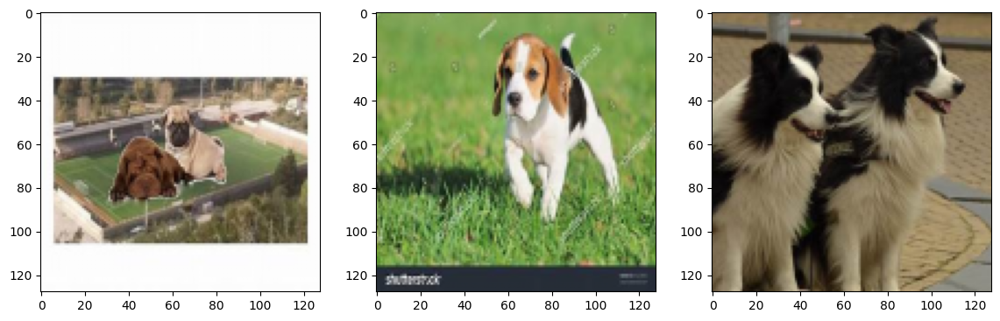

In [12]:
image_visualization(path=create_dir[0], number_of_image=3)

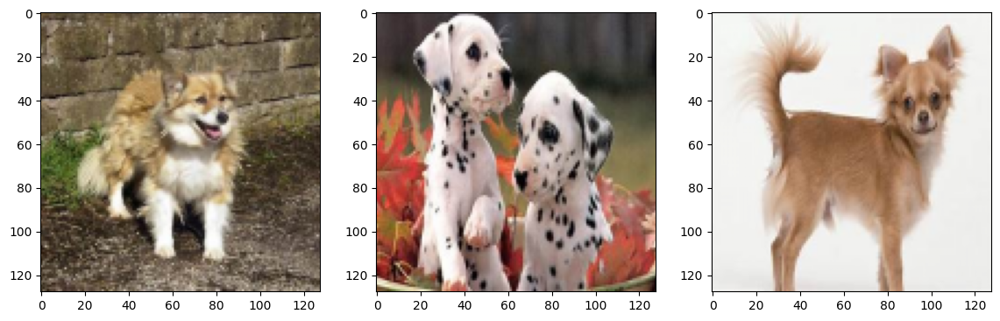

In [ ]:
image_visualization(path=create_dir[1], number_of_image=3)

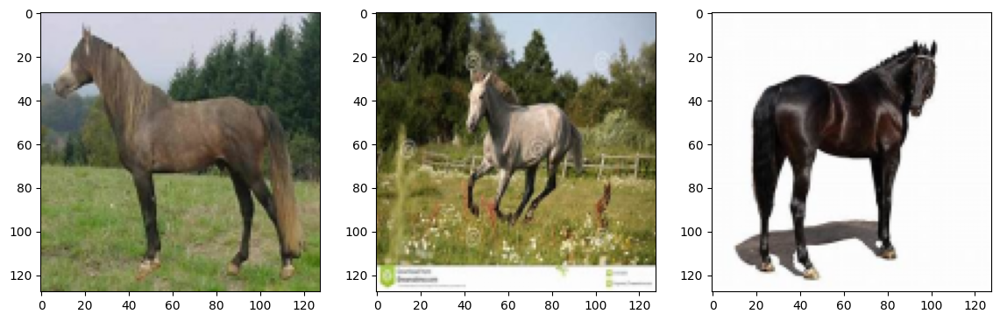

In [ ]:
image_visualization(path=create_dir[2], number_of_image=3)

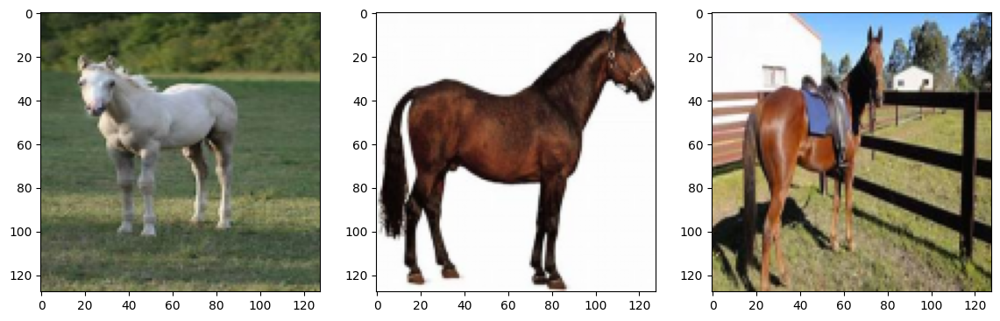

In [ ]:
image_visualization(path=create_dir[3], number_of_image=3)

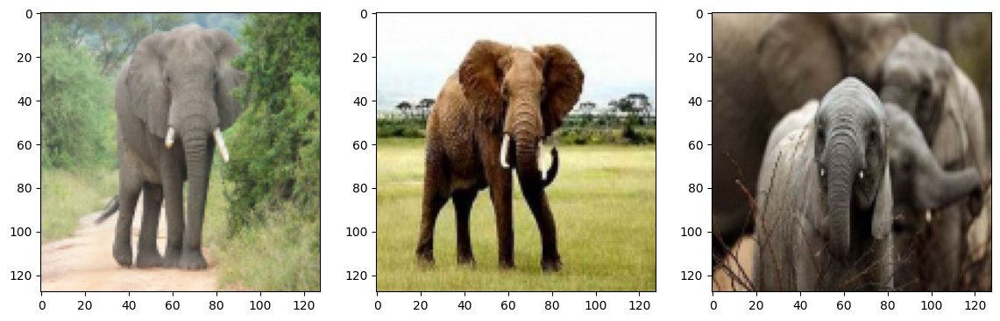

In [ ]:
image_visualization(path=create_dir[4], number_of_image=3)

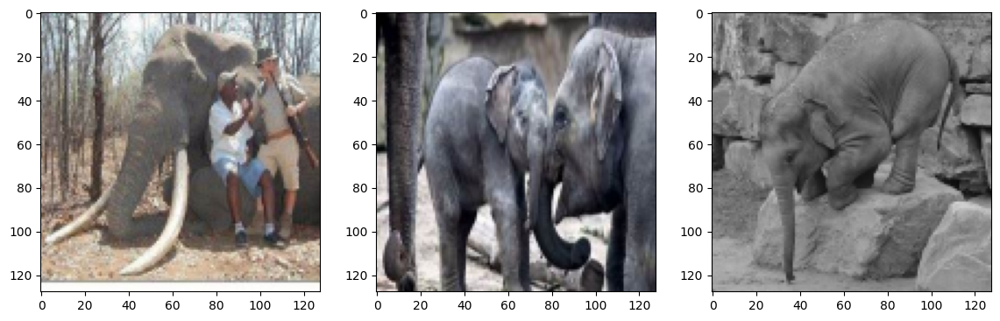

In [ ]:
image_visualization(path=create_dir[5], number_of_image=3)

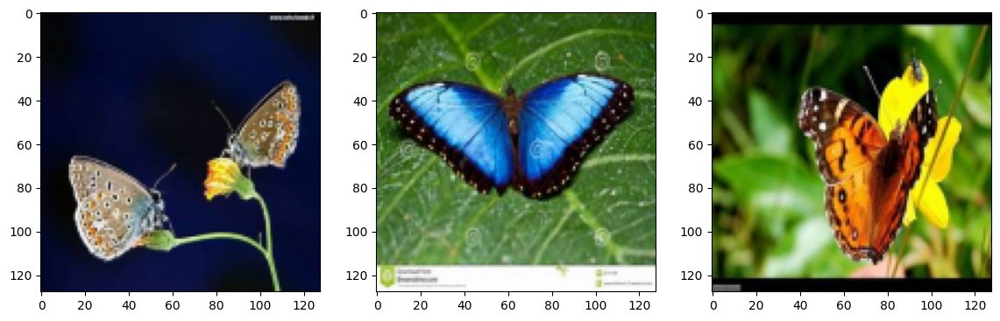

In [ ]:
image_visualization(path=create_dir[6], number_of_image=3)

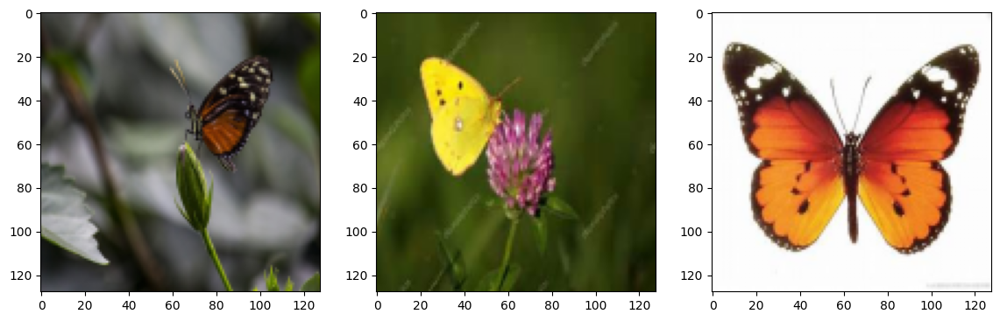

In [ ]:
image_visualization(path=create_dir[7], number_of_image=3)

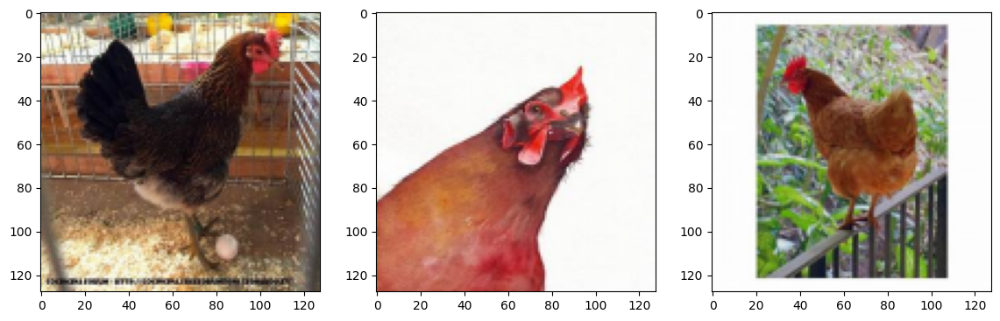

In [ ]:
image_visualization(path=create_dir[8], number_of_image=3)

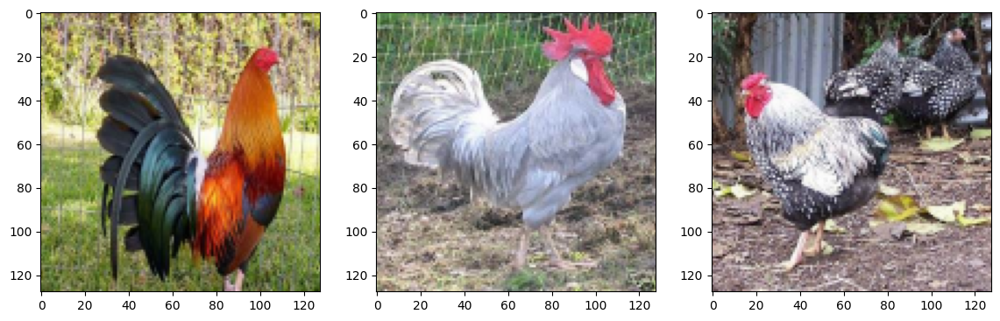

In [ ]:
image_visualization(path=create_dir[9], number_of_image=3)

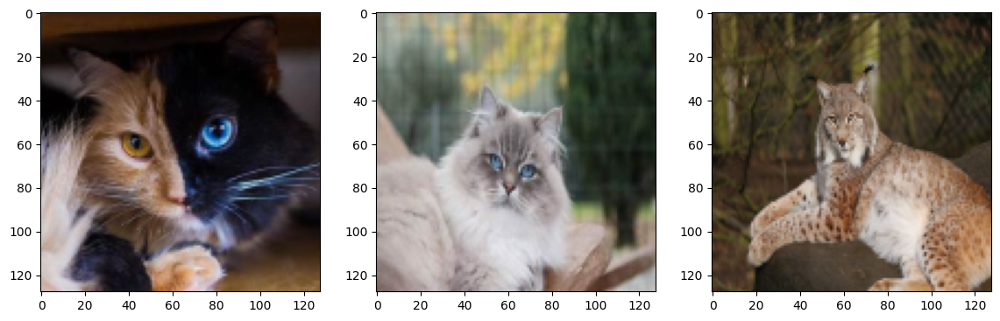

In [ ]:
image_visualization(path=create_dir[10], number_of_image=3)

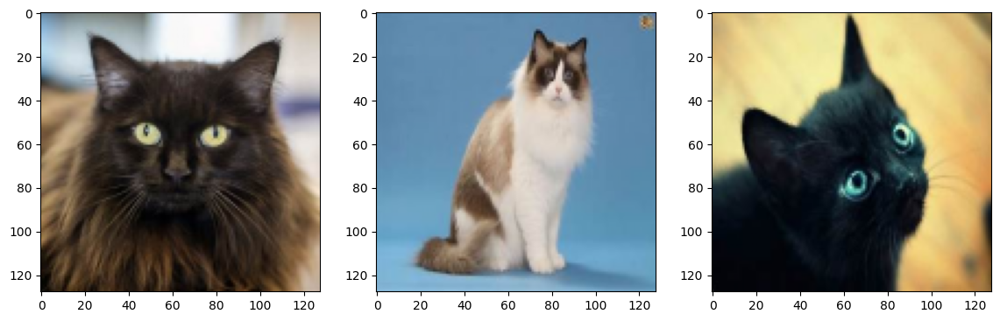

In [ ]:
image_visualization(path=create_dir[11], number_of_image=3)

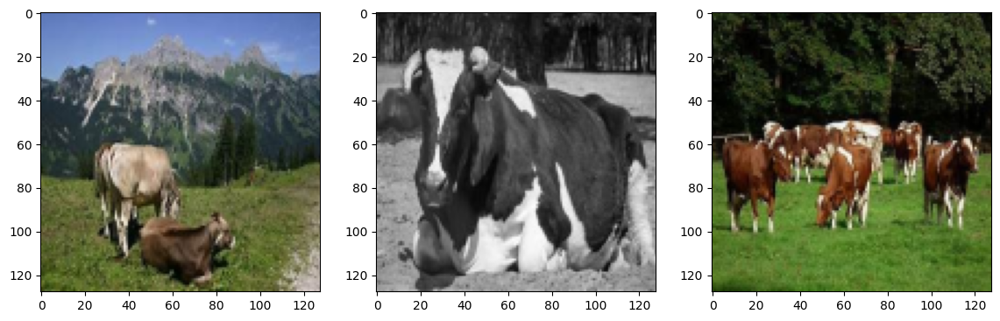

In [ ]:
image_visualization(path=create_dir[12], number_of_image=3)

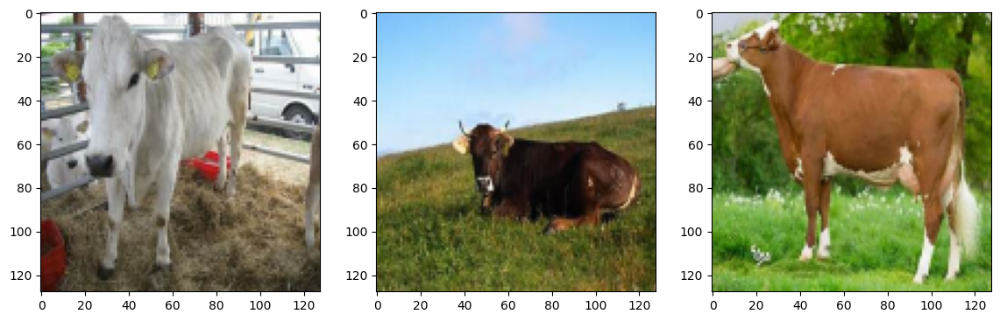

In [ ]:
image_visualization(path=create_dir[13], number_of_image=3)

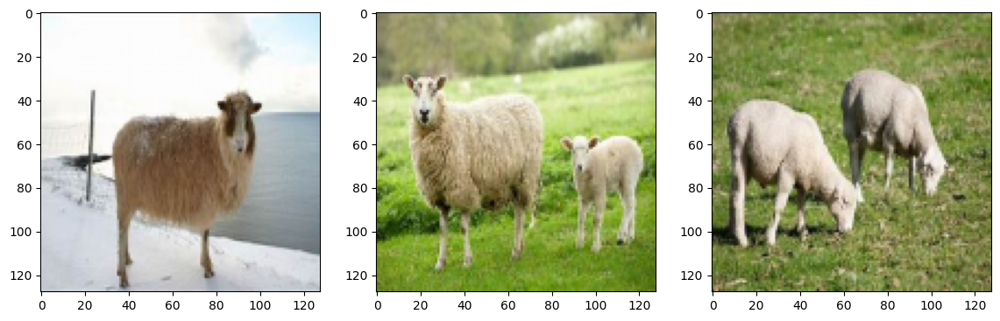

In [ ]:
image_visualization(path=create_dir[14], number_of_image=3)

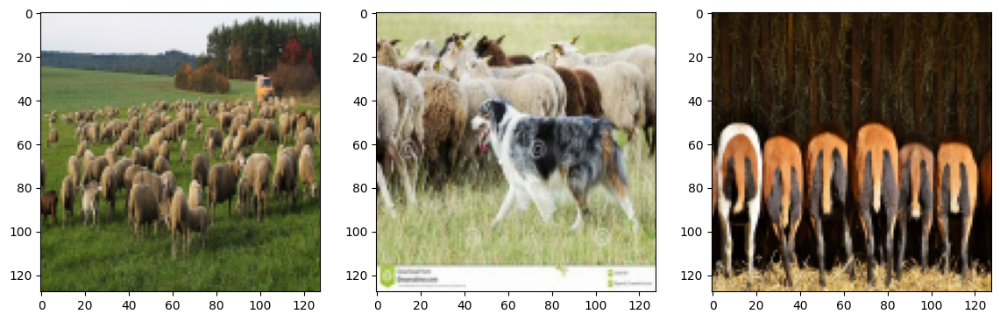

In [13]:
image_visualization(path=create_dir[15], number_of_image=3)

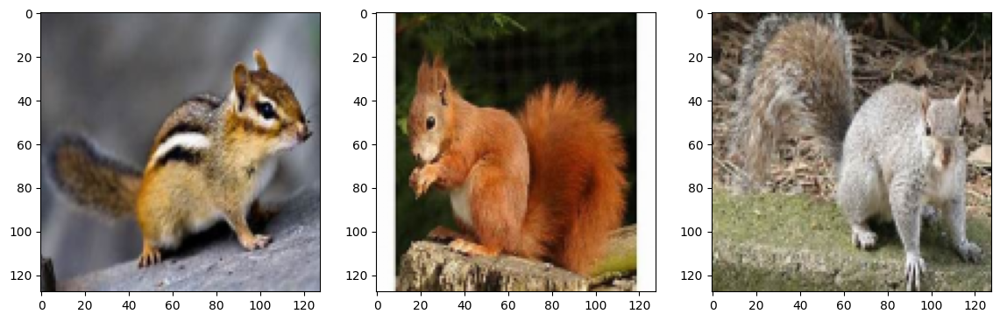

In [ ]:
image_visualization(path=create_dir[16], number_of_image=3)

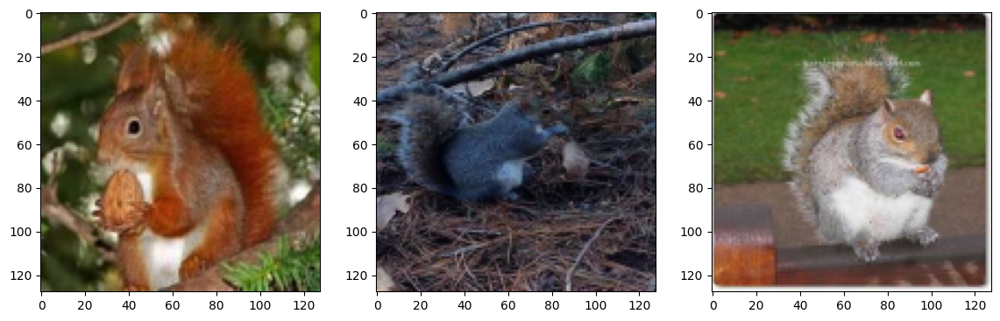

In [ ]:
image_visualization(path=create_dir[17], number_of_image=3)

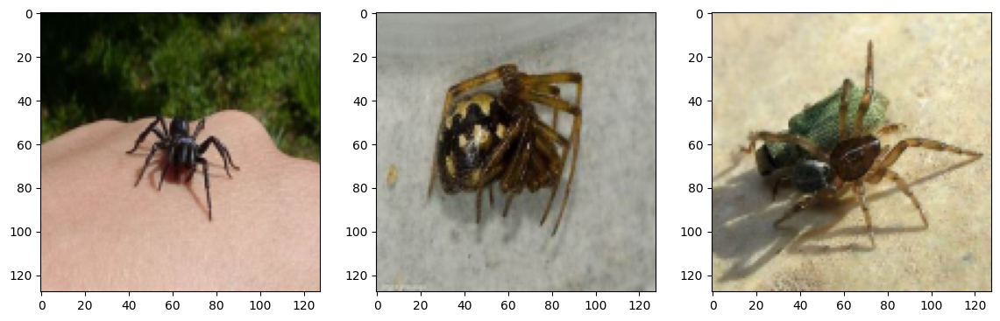

In [ ]:
image_visualization(path=create_dir[18], number_of_image=3)

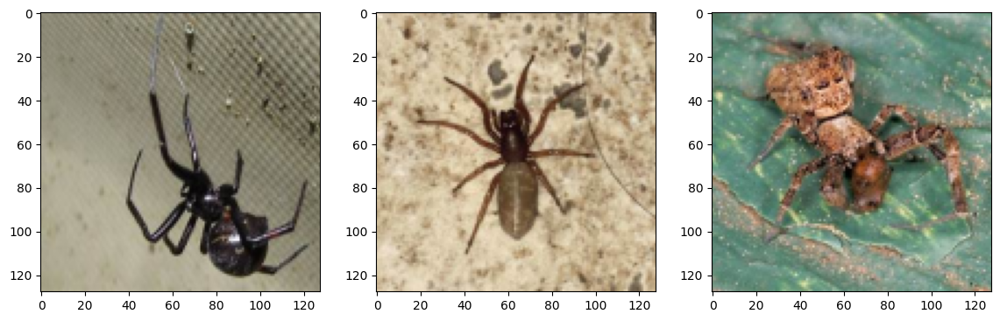

In [ ]:
image_visualization(path=create_dir[19], number_of_image=3)

Все безупречно, по итогу у нас есть пути, в которых храняться отдельно тренировочные и тестовые данные

/raw-img/training_set/*Название животного* - путь к тренировчным данным

/raw-img/test_set/*Название животного* - путь к тестовым данным

### Инициализация Даталоадера

Пропишем необходимые преобразования для изображений

In [14]:
train_transforms = transforms.Compose([
                             transforms.Resize((224, 224)),
                             transforms.RandomHorizontalFlip(),
                             transforms.ToTensor(),
                             transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
                                     ])

test_transforms = transforms.Compose([
                             transforms.Resize((224, 224)),
                             transforms.RandomHorizontalFlip(),
                             transforms.ToTensor(),
                             transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
                                     ])

In [15]:
ls './raw-img/training_set'

cane/     elefante/  gallina/  mucca/   ragno/
cavallo/  farfalla/  gatto/    pecora/  scoiattolo/


In [16]:
BATCH_SIZE = 32

train_path = './raw-img/training_set'
test_path = './raw-img/test_set'

train_set = tv.datasets.ImageFolder(root = train_path, transform = train_transforms)
test_set = tv.datasets.ImageFolder(root = test_path, transform = test_transforms)

train_loader = torch.utils.data.DataLoader(dataset=train_set, batch_size=BATCH_SIZE,
                                           shuffle=True, num_workers=1, drop_last=True
                                          )
test_loader = torch.utils.data.DataLoader(dataset=test_set, batch_size=BATCH_SIZE,
                                           shuffle=True, num_workers=1, drop_last=True
                                          )

In [17]:
for sample in train_set:
  print(sample[0].shape)
  break

torch.Size([3, 224, 224])


## Transfer Learning

Выберем модель из коробки. Выбор остановился на ***RESNET50***

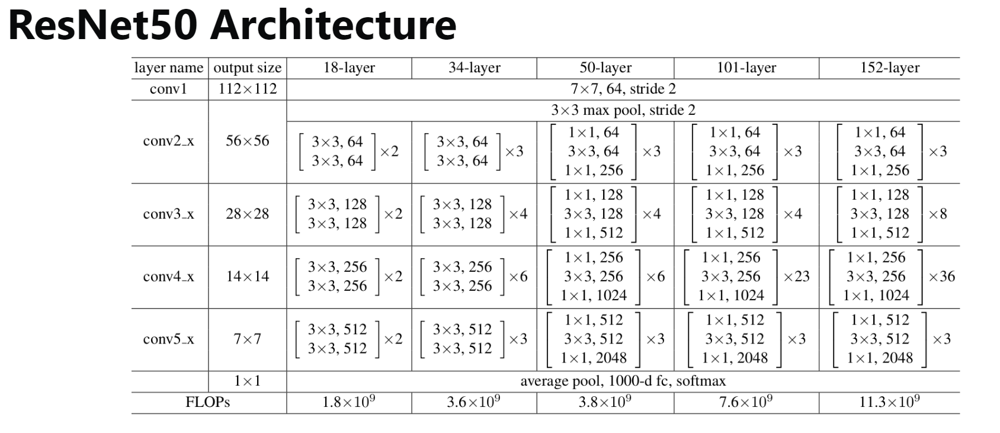

### Resnet 50

Функция для подсчета кол-ва параметров в модели

In [18]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

In [19]:
model = tv.models.resnet50(weights=tv.models.ResNet50_Weights)

/usr/local/lib/python3.9/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 158MB/s]


In [20]:
model.fc

Linear(in_features=2048, out_features=1000, bias=True)

Веса в сверточных слоях трогать не будем, видоизменим выходной слой

In [21]:
classifier = nn.Sequential(
    nn.Linear(2048, 128),
    nn.LeakyReLU(),
    nn.Linear(128, 10)
)
model.fc = classifier
model.fc

Sequential(
  (0): Linear(in_features=2048, out_features=128, bias=True)
  (1): LeakyReLU(negative_slope=0.01)
  (2): Linear(in_features=128, out_features=10, bias=True)
)

In [22]:
count_parameters(model)

23771594

В обучении модели будем использовать ***Adam*** с дефолтными параметрами

In [23]:
loss = torch.nn.CrossEntropyLoss()

Adam = torch.optim.Adam(model.parameters(), lr=0.001, betas=(0.9, 0.999))

device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda', index=0)

## Обучение

Обучим модель и сразу будем делать предсказания на тестовом датасете

In [24]:
def train(model, train_loader, test_loader, num_epochs, loss, optimizer):
    scheduler = torch.optim.lr_scheduler.ExponentialLR(
                      optimizer,
                      gamma = 0.6) # умножает каждую эпоху lr на 0.6
    
    test_loss_history = []
    test_acc_history = []
    
    model = model.to(device)
    
    for epoch in range(num_epochs):
        loss_val = 0
        acc_val = 0
        loss_val_test = 0
        acc_val_test = 0

        for img, label in (pbar := tqdm(train_loader)):

            model.train()
            img = img.to(device)
            label = label.to(device)
            optimizer.zero_grad() # Обнулим градиенты весов

            pred = model(img)

            loss_value = loss(pred, label)
            loss_value.backward()
            loss_item = loss_value.item()
            loss_val += loss_item

            optimizer.step()

            acc_current = (pred.argmax(dim=1) == label.view(1, -1)).float().mean().data.cpu()
            acc_val += acc_current
            
            pbar.set_description(f'loss: {loss_item:.5f}\taccuracy: {acc_current:.3f}')  
        
        scheduler.step()

        for X, y in test_loader:

            model.eval()
            
            X = X.to(device)
            y = y.to(device)
            with torch.no_grad():
                test_pred = model(X)
            
            loss_value_test = loss(test_pred, y).data.cpu()
            loss_item_test = loss_value_test.item()
            loss_val_test += loss_item_test
        
            acc_current_test = (test_pred.argmax(dim=1) == y).float().mean().data.cpu()
            acc_val_test += acc_current_test
        
        
        test_loss_history.append(loss_val_test/len(test_loader))
        test_acc_history.append(acc_val_test/len(test_loader))
        
        print(f'EPOCH №{epoch + 1}')
        print(20*'--')
        print(f'train loss: {loss_val/(len(train_loader)):.2f}')
        print(f'train accuracy: {acc_val/(len(train_loader)):.2f}')
        print(30*'--')
        print(f'test loss: {loss_val_test/(len(test_loader)):.2f}')
        print(f'test accuracy: {acc_val_test/(len(test_loader)):.2f}')
        print(50*'--')

    return test_acc_history, test_loss_history

In [25]:
accuracies, losses = \
          train(model=model, 
                train_loader=train_loader,
                test_loader=test_loader,
                num_epochs=5,
                loss=loss,
                optimizer=Adam)

loss: 0.56778	accuracy: 0.812: 100%|██████████| 654/654 [04:03<00:00,  2.69it/s]


EPOCH №1
----------------------------------------
train loss: 0.99
train accuracy: 0.68
------------------------------------------------------------
test loss: 0.90
test accuracy: 0.70
----------------------------------------------------------------------------------------------------


loss: 0.52302	accuracy: 0.875: 100%|██████████| 654/654 [03:46<00:00,  2.88it/s]


EPOCH №2
----------------------------------------
train loss: 0.50
train accuracy: 0.84
------------------------------------------------------------
test loss: 0.56
test accuracy: 0.82
----------------------------------------------------------------------------------------------------


loss: 0.21123	accuracy: 0.938: 100%|██████████| 654/654 [03:46<00:00,  2.88it/s]


EPOCH №3
----------------------------------------
train loss: 0.30
train accuracy: 0.90
------------------------------------------------------------
test loss: 0.30
test accuracy: 0.91
----------------------------------------------------------------------------------------------------


loss: 0.07410	accuracy: 0.969: 100%|██████████| 654/654 [03:49<00:00,  2.85it/s]


EPOCH №4
----------------------------------------
train loss: 0.18
train accuracy: 0.94
------------------------------------------------------------
test loss: 0.28
test accuracy: 0.91
----------------------------------------------------------------------------------------------------


loss: 0.03359	accuracy: 1.000: 100%|██████████| 654/654 [03:49<00:00,  2.86it/s]


EPOCH №5
----------------------------------------
train loss: 0.11
train accuracy: 0.96
------------------------------------------------------------
test loss: 0.23
test accuracy: 0.93
----------------------------------------------------------------------------------------------------


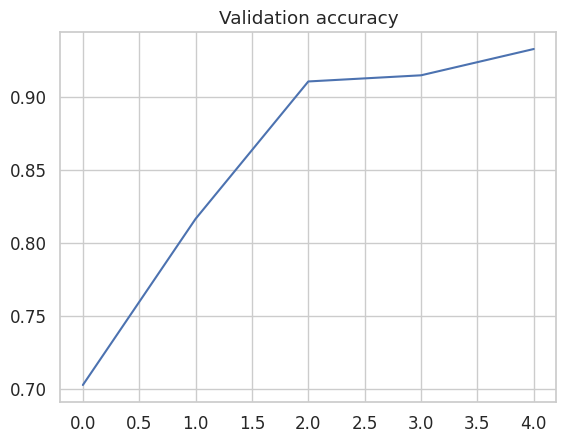

In [31]:
import seaborn as sns

sns.set(style="whitegrid", font_scale=1.1)

plt.plot(accuracies)

plt.title('Validation accuracy')
plt.show()

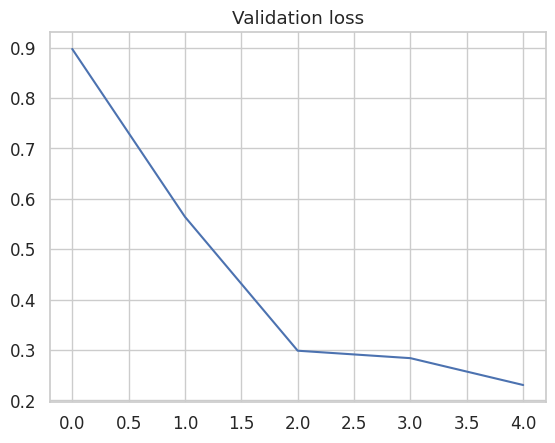

In [33]:
sns.set(style="whitegrid", font_scale=1.1)

plt.plot(losses)

# plt.legend()
plt.title('Validation loss')
plt.show()

### Сохранение модели на диск

In [34]:
model_save_name = 'RESNET50.pt'
PATH = f"/content/drive/My Drive/My_save_models/Animals-10/{model_save_name}" 
torch.save(model.state_dict(), PATH)

## Предсказание на тестовых данных

In [35]:
model_save_name = 'RESNET50.pt'
PATH = f"/content/drive/My Drive/My_save_models/Animals-10/{model_save_name}" 
model.load_state_dict(torch.load(PATH))

<All keys matched successfully>

In [170]:
examples_path = 'drive/My Drive/Deep Learning projects/Animal-10/examples'

In [131]:
def transform_pictures(path:str, number_of_images: int):
    
    try:
        img_path = [os.path.join(path, sorted(os.listdir(path))[i]) for i in range(number_of_images)]
        PIL_images = [Image.open(img) for img in img_path[:number_of_images]]
        test_batch = torch.stack([test_transforms(img).to(device) for img in PIL_images])
 
        return {'test_batch': test_batch,
                'images': PIL_images}

    except IndexError:
        print(f"num_of_pic {number_of_images} больше чем кол-во фотографий {len(os.listdir(path))} в папке")

In [165]:
def example_visualization(examples_path, model, num_of_pic):
    try:
        examples = transform_pictures(examples_path, num_of_pic)
    
        model = model.to(device)
        pred_logits = model(examples['test_batch'])
        pred_prob = F.softmax(pred_logits, dim=1).cpu().data.numpy()

        fig, ax = plt.subplots(nrows = num_of_pic, ncols = 1, figsize=(15,20))

        for i in range(num_of_pic):
            top_n = pred_prob.argsort()[i][::-1][:3]
            
            ax[i].axis('off')
            ax[i].imshow(examples['images'][i])
            ax[i].set_title(f'{(100*pred_prob[i][top_n[0]]):.0f}% {list(translate.values())[top_n[0]]}\
                              {(100*pred_prob[i][top_n[1]]):.0f}% {list(translate.values())[top_n[1]]}\
                              {(100*pred_prob[i][top_n[2]]):.0f}% {list(translate.values())[top_n[2]]} ', fontsize=10)

    except TypeError:
        print('Oперация применена к объекту несоответствующего типа.')
    

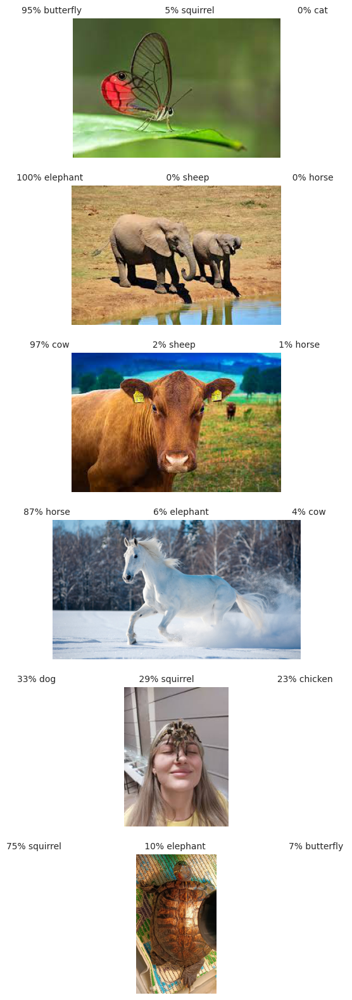

In [173]:
example_visualization(examples_path, model, 6)